In [ ]:
gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

from psutil import virtual_memory
ram_gb = virtual_memory().total / 1e9
print('Your runtime has {:.1f} gigabytes of available RAM\n'.format(ram_gb))

if ram_gb < 20:
  print('Not using a high-RAM runtime')
else:
  print('You are using a high-RAM runtime!')

Thu Aug 18 19:56:34 2022       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 460.32.03    Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla V100-SXM2...  Off  | 00000000:00:04.0 Off |                    0 |
| N/A   46C    P0    42W / 300W |   1023MiB / 16160MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

## Install TensorTrade

In [ ]:
!python3 -m pip install git+https://github.com/tensortrade-org/tensortrade.git
!pip install ccxt
!pip install stable-baselines3
!pip install ta
!pip install pyyaml==5.4.1

# Load the TensorBoard notebook extension
%load_ext tensorboard

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/tensortrade-org/tensortrade.git to /tmp/pip-req-build-bynhl3s2
  Running command git clone -q https://github.com/tensortrade-org/tensortrade.git /tmp/pip-req-build-bynhl3s2
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [ ]:
!pip install quantstats

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


## Setup Data Fetching

In [ ]:
import pandas as pd
import tensortrade.env.default as default
import ta

import ccxt
from datetime import datetime, timedelta, time
from sklearn.preprocessing import RobustScaler, StandardScaler, PowerTransformer, MinMaxScaler

from tensortrade.data.cdd import CryptoDataDownload
from tensortrade.feed.core import Stream, DataFeed
from tensortrade.oms.exchanges import Exchange
from tensortrade.oms.services.execution.simulated import execute_order
from tensortrade.oms.instruments import USDT, BTC, ETH
from tensortrade.oms.wallets import Wallet, Portfolio
from tensortrade.agents import DQNAgent

from stable_baselines3 import A2C, PPO, DQN

%matplotlib inline

In [ ]:
from tensortrade.data.cdd import CryptoDataDownload

import numpy as np
import pandas as pd
pd.options.mode.use_inf_as_na = True

def prepare_data(df):
    df['volume'] = np.int64(df['volume'])
    df['date'] = pd.to_datetime(df['date'])
    df.sort_values(by='date', ascending=True, inplace=True)
    df.reset_index(drop=True, inplace=True)
    df['date'] = df['date'].dt.strftime('%Y-%m-%d')
    return df

def fetch_data():
    cdd = CryptoDataDownload()
    bitfinex_data = cdd.fetch("Bitfinex", "USD", "BTC", "d")
    bitfinex_data = bitfinex_data[['date', 'open', 'high', 'low', 'close', 'volume']]
    bitfinex_data = prepare_data(bitfinex_data)
    print(bitfinex_data)
    return bitfinex_data

def load_csv(filename):
    df = pd.read_csv('data/' + filename, skiprows=1)
    df.drop(columns=['symbol', 'volume_btc'], inplace=True)

    # Fix timestamp from "2019-10-17 09-AM" to "2019-10-17 09-00-00 AM"
    df['date'] = df['date'].str[:14] + '00-00 ' + df['date'].str[-2:]

    return prepare_data(df)


fetch_data()


            date          open          high       low         close  \
0     2015-02-09    224.220000    225.000000    215.40    220.610000   
1     2015-02-10    220.610000    223.880000    214.00    220.960000   
2     2015-02-11    220.960000    224.400000    218.10    219.190000   
3     2015-02-12    219.190000    223.200000    217.87    222.600000   
4     2015-02-13    222.390000    241.760000    221.46    236.000000   
...          ...           ...           ...       ...           ...   
2743  2022-08-14  24435.000000  25068.000000  24143.00  24300.000000   
2744  2022-08-15  24303.000000  25205.000000  23758.00  24094.000000   
2745  2022-08-16  24091.000000  24234.106237  23679.00  23856.000000   
2746  2022-08-17  23855.764643  24440.000000  23170.00  23332.485373   
2747  2022-08-18  23332.000000  23474.000000  23290.00  23463.379020   

         volume  
0       6493501  
1       6402350  
2       4268986  
3       2468883  
4       6806972  
...         ...  
2743   66

,date,open,high,low,close,volume
0,2015-02-09,224.220000,225.000000,215.40,220.610000,6493501
1,2015-02-10,220.610000,223.880000,214.00,220.960000,6402350
2,2015-02-11,220.960000,224.400000,218.10,219.190000,4268986
3,2015-02-12,219.190000,223.200000,217.87,222.600000,2468883
4,2015-02-13,222.390000,241.760000,221.46,236.000000,6806972
...,...,...,...,...,...,...
2743,2022-08-14,24435.000000,25068.000000,24143.00,24300.000000,66677810
2744,2022-08-15,24303.000000,25205.000000,23758.00,24094.000000,215251202
2745,2022-08-16,24091.000000,24234.106237,23679.00,23856.000000,66040849
2746,2022-08-17,23855.764643,24440.000000,23170.00,23332.485373,142939854


In [ ]:
import ta
import pandas as pd

#BTC/USD data, volume = volume of BTC
from ta import add_all_ta_features
data = fetch_data()

start_date = '2015-02-09'
end_date = '2022-07-16'
after_start_date = data["date"] >= start_date
before_end_date = data["date"] <= end_date
between_two_dates = after_start_date & before_end_date
# Using pandas.DataFrame.loc to Filter Rows by Dates
data = data.loc[between_two_dates]

features = data.copy()
# features = add_all_ta_features(
#     features, open="open", high="high", low="low", close="close", volume="volume", fillna=True)

data = data[['open','high','low','close','volume','date']]


            date          open          high       low         close  \
0     2015-02-09    224.220000    225.000000    215.40    220.610000   
1     2015-02-10    220.610000    223.880000    214.00    220.960000   
2     2015-02-11    220.960000    224.400000    218.10    219.190000   
3     2015-02-12    219.190000    223.200000    217.87    222.600000   
4     2015-02-13    222.390000    241.760000    221.46    236.000000   
...          ...           ...           ...       ...           ...   
2743  2022-08-14  24435.000000  25068.000000  24143.00  24300.000000   
2744  2022-08-15  24303.000000  25205.000000  23758.00  24094.000000   
2745  2022-08-16  24091.000000  24234.106237  23679.00  23856.000000   
2746  2022-08-17  23855.764643  24440.000000  23170.00  23332.485373   
2747  2022-08-18  23332.000000  23474.000000  23290.00  23463.379020   

         volume  
0       6493501  
1       6402350  
2       4268986  
3       2468883  
4       6806972  
...         ...  
2743   66

In [ ]:
features['sma'] = ta.trend.sma_indicator(features['close'], window = 15, fillna = True)

features.columns

Index(['date', 'open', 'high', 'low', 'close', 'volume', 'sma'], dtype='object')

In [ ]:
from sklearn.compose import make_column_transformer
#Function to Standardising data and excluding anomynous
def prepare_input(X):

  names = X.copy()

  volume = X.select_dtypes(include=['int64']).columns

  prices_columns = X.select_dtypes(include=['float64']).columns

  column_trans = make_column_transformer(

      (MinMaxScaler(feature_range=(-1,1)), prices_columns),
      (MinMaxScaler(feature_range=(0,1)), volume),

      remainder='passthrough'

      )

  X = column_trans.fit_transform(X)

  df = pd.DataFrame(X, columns= column_trans.get_feature_names_out())

  df = df.rename({'remainder__date': 'date'}, axis='columns') #,'minmaxscaler-2__volume':'volume'

  cols=[i for i in df.columns if i not in ["date"]]
  for col in cols:
      df[col]=pd.to_numeric(df[col])

  
  return df

In [ ]:
features = prepare_input(features)

train/test split: training 10:1 testing 

In [ ]:



first_cols = ['date']
last_cols = [col for col in features.columns if col not in first_cols]

view = features[first_cols+last_cols]


train_size = 10
split = int(len(data)/(1/train_size+1))
train_data = data.iloc[:split,:].copy()
test_data = data.iloc[split:,:].copy()
train_view = view.iloc[:split,:].copy()
test_view = view.iloc[split:,:].copy()
print(len(train_data))
print(len(test_data))

2468
247


In [ ]:
import plotly.express as px
fig = px.line(features, x='date',y= features.columns) 
fig.show()

In [ ]:
train_data

,open,high,low,close,volume,date
0,224.220000,225.00,215.40,220.61,6493501,2015-02-09
1,220.610000,223.88,214.00,220.96,6402350,2015-02-10
2,220.960000,224.40,218.10,219.19,4268986,2015-02-11
3,219.190000,223.20,217.87,222.60,2468883,2015-02-12
4,222.390000,241.76,221.46,236.00,6806972,2015-02-13
...,...,...,...,...,...,...
2463,61495.043887,63279.00,61400.00,63263.00,204629120,2021-11-07
2464,63277.000000,67665.00,63277.00,67526.00,606485965,2021-11-08
2465,67526.000000,68444.00,66326.00,66938.00,432722748,2021-11-09
2466,66937.190226,68958.00,62866.00,64871.00,793693585,2021-11-10


In [ ]:
test_data

,open,high,low,close,volume,date
2468,64785.000000,65421.000000,62255.000000,64134.000000,328314220,2021-11-12
2469,64134.000000,64988.986282,63405.000000,64398.000000,120309117,2021-11-13
2470,64395.000000,65474.000000,63564.000000,65474.000000,143689598,2021-11-14
2471,65474.000000,66343.875554,63351.000000,63561.000000,335054048,2021-11-15
2472,63560.000000,63561.992029,58625.687342,60068.000000,784932415,2021-11-16
...,...,...,...,...,...,...
2710,19945.000000,20038.233653,19216.566333,19310.533476,130887320,2022-07-12
2711,19308.000000,20347.000000,18912.596920,20246.000000,242951062,2022-07-13
2712,20232.000000,21026.000000,19625.000000,20582.000000,124704257,2022-07-14
2713,20580.881622,21195.000000,20373.000000,20820.000000,74761939,2022-07-15


## Setup Trading Environment

In [ ]:
import numpy as np
from gym.spaces import Box, Space
from tensortrade.env.default.observers import _create_internal_streams, ObservationHistory
from tensortrade.env.generic import Observer
from tensortrade.feed import DataFeed, Stream
from tensortrade.oms.wallets import Portfolio

Action Scheme

In [ ]:
class BSH(default.actions.TensorTradeActionScheme):
    """A simple discrete action scheme where the only options are to buy, sell,
    or hold.
    Parameters
    ----------
    cash : `Wallet`
        The wallet to hold funds in the base intrument.
    asset : `Wallet`
        The wallet to hold funds in the quote instrument.
    """

    registered_name = "bsh"

    def __init__(self, cash: 'Wallet', asset: 'Wallet'):
        super().__init__()
        self.cash = cash
        self.asset = asset

        self.listeners = []
        self.action = 0

    @property
    def action_space(self):
        return Discrete(2)

    def attach(self, listener):
        self.listeners += [listener]
        return self

    def get_orders(self, action: int, portfolio: 'Portfolio') -> 'Order':
        order = None

        if abs(action - self.action) > 0:
            src = self.cash if self.action == 0 else self.asset
            tgt = self.asset if self.action == 0 else self.cash

            if src.balance == 0:  # We need to check, regardless of the proposed order, if we have balance in 'src'
                return []  # Otherwise just return an empty order list

            order = proportion_order(portfolio, src, tgt, 1.0)
            self.action = action

        for listener in self.listeners:
            listener.on_action(action)

        return [order]

    def reset(self):
        super().reset()
        self.action = 0

Reward scheme

In [ ]:
import numpy as np
class SimpleProfit(default.rewards.TensorTradeRewardScheme):
    """A simple reward scheme that rewards the agent for incremental increases
    in net worth.

    Parameters
    ----------
    window_size : int
        The size of the look back window for computing the reward.

    Attributes
    ----------
    window_size : int
        The size of the look back window for computing the reward.
    """

    def __init__(self, window_size: int = 14):
        self._window_size = self.default('window_size', window_size)

    def get_reward(self, portfolio: 'Portfolio') -> float:
        """Rewards the agent for incremental increases in net worth over a
        sliding window.

        Parameters
        ----------
        portfolio : `Portfolio`
            The portfolio being used by the environment.

        Returns
        -------
        float
            The cumulative percentage change in net worth over the previous
            `window_size` time steps.
        """
        net_worths = [nw['net_worth'] for nw in portfolio.performance.values()]
        returns = [(b - a)/a for a, b in zip(net_worths[::1], net_worths[1::1])]
        #if len(net_worths) > 4:
        #  print(net_worths[-3:])
        #  print(returns[-2:])
        #returns = np.array([x + 1 for x in returns[-self._window_size:]]).cumprod() - 1
        return 0 if len(returns) < 1 else returns[-1]


Compile data to Environment

In [ ]:
from typing import Union

from tensortrade.env.default import observers
from tensortrade.env.default import stoppers
from tensortrade.env.default import informers
from tensortrade.env.default import renderers

from tensortrade.env.generic import TradingEnv
from tensortrade.env.generic.components.renderer import AggregateRenderer
from tensortrade.feed.core import DataFeed
from tensortrade.oms.wallets import Portfolio
from tensortrade.oms.exchanges import Exchange, ExchangeOptions

def create_env(data: pd.DataFrame, view: pd.DataFrame, is_train_data: bool):
  features = []
  for c in data.columns[:]:
      if data[c].name == 'date':
        if is_train_data and False:
          s = Stream.source(list(data[c]), dtype="DateTime").rename('timestamp')
        else:
          continue
      else:
        s = Stream.source(list(data[c]), dtype="float").rename(data[c].name)
      features += [s]


  feed = DataFeed(features)
  feed.compile()



# TODO: adjust according to your commission percentage, if present
  commission = 0.005
  slippage = ExchangeOptions(commission=commission)

  price = Stream.source(list(view["close"]), dtype="float").rename("USDT-BTC")
  binance = Exchange("binance", service=execute_order,
                      options=slippage)(
      price
  )

  cash = Wallet(binance, 10000 * USDT)
  asset = Wallet(binance, 0 * BTC)

  portfolio = Portfolio(USDT, [
      cash,
      asset
  ])


  renderer_feed = DataFeed([
      Stream.source(list(view["date"])).rename("date"),
      Stream.source(list(view["open"]), dtype="float").rename("open"),
      Stream.source(list(view["high"]), dtype="float").rename("high"),
      Stream.source(list(view["low"]), dtype="float").rename("low"),
      Stream.source(list(view["close"]), dtype="float").rename("close"), 
      Stream.source(list(view["volume"]), dtype="float").rename("volume") 
  ])


  env = default.create(
      portfolio=portfolio,
      action_scheme=default.actions.BSH(cash, asset),
      #reward_scheme=default.rewards.PBR(price),
      reward_scheme=SimpleProfit(window_size=10),
      #reward_scheme='risk-adjusted',
      feed=feed,
      renderer_feed=renderer_feed,
      renderer=default.renderers.PlotlyTradingChart(),
      window_size=40,
      stopper=default.stoppers.MaxLossStopper(0.75),
      min_periods= None
  ) if is_train_data else default.create(
      portfolio=portfolio,
      action_scheme=default.actions.BSH(cash, asset),
      #reward_scheme=default.rewards.PBR(price),
      reward_scheme=SimpleProfit(window_size=10),
      #reward_scheme='risk-adjusted',
      feed=feed,
      renderer_feed=renderer_feed,
      renderer=default.renderers.PlotlyTradingChart(),
      window_size=40,
      stopper=default.stoppers.MaxLossStopper(0.75),
      min_periods=None
  )

  return env

In [ ]:
from google.colab import output
output.enable_custom_widget_manager()
# Load the TensorBoard notebook extension
%load_ext tensorboard

%tensorboard --logdir logs

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 283), started 0:13:59 ago. (Use '!kill 283' to kill it.)

<IPython.core.display.Javascript object>

## Setup and Train A2C Agent

**Training agents train loop**

In [ ]:
episode = 30

The Agents see:


Defined repeat_agent_training = 3
Full data contains: 2468 steps.
DQN model:
repeat_agent_training: 1 | ran steps = 551 | No. of trade = 233 | % Return = -75.3
repeat_agent_training: 2 | ran steps = 533 | No. of trade = 219 | % Return = -75.4
repeat_agent_training: 3 | ran steps = 548 | No. of trade = 232 | % Return = -75.1
PPO model:
repeat_agent_training: 1 | ran steps = 2468 | No. of trade = 985 | % Return = 980.2
repeat_agent_training: 2 | ran steps = 2468 | No. of trade = 971 | % Return = 800.8
repeat_agent_training: 3 | ran steps = 2468 | No. of trade = 985 | % Return = 586.8
A2C model:
repeat_agent_training: 1 | ran steps = 2468 | No. of trade = 11 | % Return = 30083.3
repeat_agent_training: 2 | ran steps = 2468 | No. of trade = 9 | % Return = 28419.2
repeat_agent_training: 3 | ran steps = 2468 | No. of trade = 3 | % Return = 28611.5
Training compelted


<function matplotlib.pyplot.show(*args, **kw)>

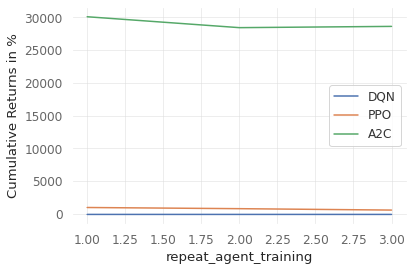

In [ ]:
print('The Agents see:')
import plotly.express as px
fig = px.line(train_view, x='date',y= train_view.columns) 
fig.show()


#Setting all training environments for all agents
train_env = create_env(train_data,train_data , False)

train_DQN = create_env(train_data,train_data , False)
train_PPO = create_env(train_data,train_data , False)
train_A2C = create_env(train_data,train_data , False)
list_train_envs = [train_DQN, train_PPO, train_A2C]

circuit = [DQN, PPO, A2C]
name_agents = ['DQN','PPO','A2C']

#Define repeat_agent_training to calculate a mean as agent is stochastic**
repeat_agent_training = 3

#reminder of steps in environment
print('Defined repeat_agent_training =',repeat_agent_training)
print('Full data contains:',len(train_data),'steps.')



#Main training loop
networth_records = []
for DRL_agents,training_environments,name in zip(circuit,list_train_envs,name_agents):
  model = DRL_agents
  print(name, 'model:')

  policy = 'MlpPolicy'

  DRL_agents = model(policy, train_env, tensorboard_log="./logs")
  DRL_agents.learn(total_timesteps=len(train_data)*episode)

  for repeat_ep in range(1,repeat_agent_training+1):
    obs = training_environments.reset()
    done = False
    while not done:
      action, _states = DRL_agents.predict(obs)
      obs, rewards, done, info = training_environments.step(action)
    
    performance = pd.DataFrame.from_dict(training_environments.action_scheme.portfolio.performance, orient='index')
    net_worth = performance['net_worth'].iloc[:]
    net_worth = net_worth.values[-1]


    Number_steps = len(training_environments.action_scheme.portfolio.performance)
    Number_trade = len(training_environments.action_scheme.broker.trades)

    # networth_records.append([name,ep,net_worth])
    # trade_records.append([Number_steps,Number_steps,])    

    print('repeat_agent_training:',repeat_ep,'| ran steps =',Number_steps,'| No. of trade =',Number_trade, '| % Return =',round(((net_worth-10000)/10000)*100,1))

    networth_records.append([name,repeat_ep,net_worth,Number_steps,Number_trade])



networth_records = pd.DataFrame(networth_records)
networth_records['returns'] = ((networth_records[[2]]-10000)/10000)*100
networth_records.rename(columns = {0: 'agents',1:'repeat_agent_training', 2:'networth', 3:'step_ran', 4:'num_trade'}, inplace = True)
K_networth_records = networth_records

DQN_train_records = K_networth_records[K_networth_records['agents']=='DQN']
PPO_train_records = K_networth_records[K_networth_records['agents']=='PPO']
A2C_train_records = K_networth_records[K_networth_records['agents']=='A2C']

#Reminder
print('Training compelted')

import matplotlib.pyplot as plt
#plot the change in return for all repeat_agent_trainings
plt.plot(DQN_train_records['repeat_agent_training'],DQN_train_records['returns'], label = "DQN")
plt.plot(PPO_train_records['repeat_agent_training'],PPO_train_records['returns'], label = "PPO")
plt.plot(A2C_train_records['repeat_agent_training'],A2C_train_records['returns'], label = "A2C")
plt.ylabel('Cumulative Returns in %')
plt.xlabel('repeat_agent_training')

plt.legend()
plt.show


DQN | mean number of step 544.0
    | mean number of trade 228.0
    | mean number of returns -75.24865282631667
PPO | mean number of step 2468.0
    | mean number of trade 980.3333333333334
    | mean number of returns 789.2600341856
A2C | mean number of step 2468.0
A2C | mean number of trade 7.666666666666667
A2C | mean number of returns 29037.9982755614


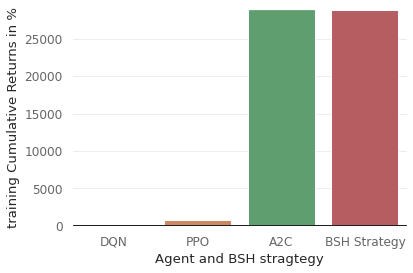

<Figure size 432x288 with 0 Axes>

In [ ]:
print('DQN | mean number of step',DQN_train_records.step_ran.mean())
print('    | mean number of trade',DQN_train_records.num_trade.mean())
print('    | mean number of returns',DQN_train_records.returns.mean())

print('=================================================')


print('PPO | mean number of step',PPO_train_records.step_ran.mean())
print('    | mean number of trade',PPO_train_records.num_trade.mean())
print('    | mean number of returns',PPO_train_records.returns.mean())
print('=================================================')

print('A2C | mean number of step',A2C_train_records.step_ran.mean())
print('A2C | mean number of trade',A2C_train_records.num_trade.mean())
print('A2C | mean number of returns',A2C_train_records.returns.mean())

BSH_train = pd.DataFrame([['BSH Strategy',28897]], columns=['agents','returns'])
train_returns = pd.DataFrame([['DQN',DQN_train_records.returns.mean()], ['PPO',PPO_train_records.returns.mean()],['A2C',A2C_train_records.returns.mean()]], columns=['agents','returns'])
compare_BSH_train = pd.concat([train_returns, BSH_train])

import seaborn as sns
plt.ylim(min(compare_BSH_train.returns), max(compare_BSH_train.returns))
train = sns.barplot(y='returns',x='agents',data=compare_BSH_train)
train.set(xlabel='Agent and BSH stragtegy', ylabel='training Cumulative Returns in %', ylim = (min(compare_BSH_train.returns), max(compare_BSH_train.returns) ))
train.axhline(y=0.0, color='black', linestyle='-', linewidth=2)
plt.show()

plt.savefig('base_train_results')

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2015-02-09
End Period                 2016-08-08
Risk-Free Rate             0.0%
Time in Market             56.0%

Cumulative Return          -75.08%
CAGR﹪                     -60.5%

Sharpe                     -2.18
Prob. Sharpe Ratio         0.06%
Smart Sharpe               -2.18
Sortino                    -2.76
Smart Sortino              -2.76
Sortino/√2                 -1.95
Smart Sortino/√2           -1.95
Omega                      0.54

Max Drawdown               -77.36%
Longest DD Days            493
Volatility (ann.)          27.55%
Calmar                     -0.78
Skew                       -0.67
Kurtosis                   15.94

Expected Daily %           -0.25%
Expected Monthly %         -7.05%
Expected Yearly %          -50.08%
Kelly Criterion            -20.64%
Risk of Ruin               0.0%
Daily Value-at-Risk        -3.09%
Expected Shortfall (cVaR

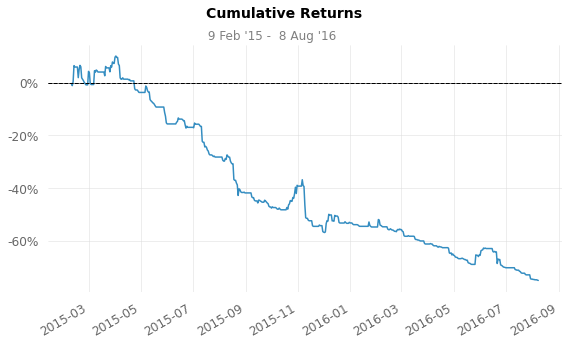

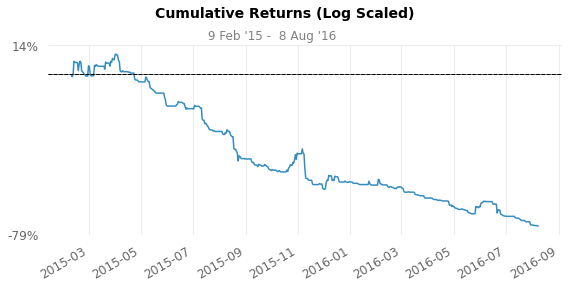

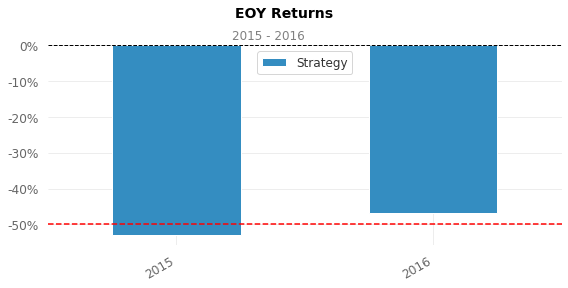

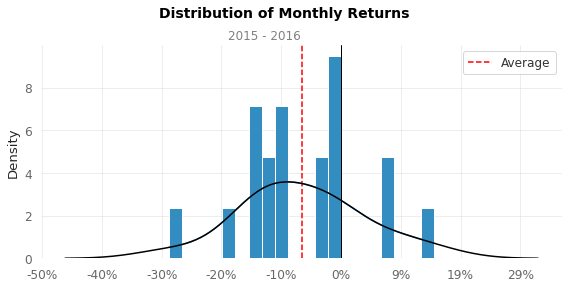

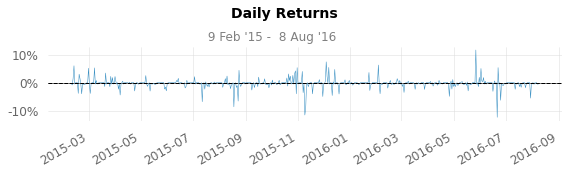

...

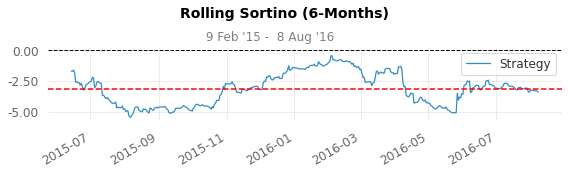

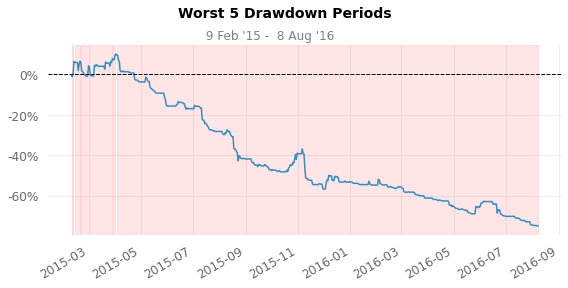

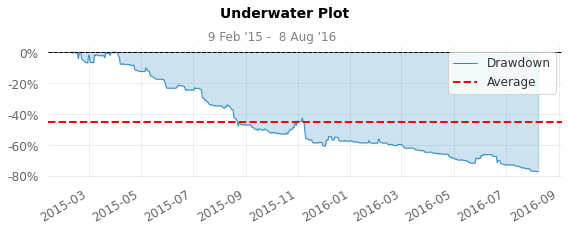

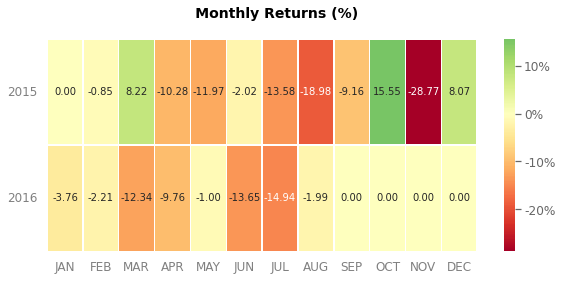

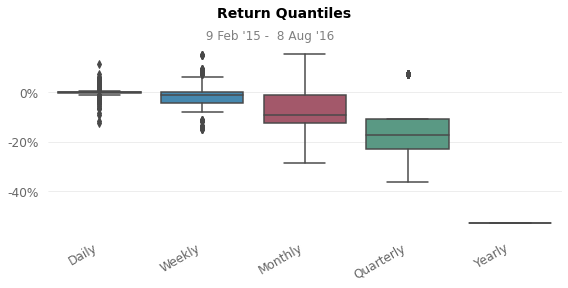

In [ ]:
import quantstats as qs
qs.extend_pandas()


def print_quantstats_full_report(env, data, output='dqn_quantstats'):
    performance = pd.DataFrame.from_dict(env.action_scheme.portfolio.performance, orient='index')
    net_worth = performance['net_worth'].iloc[:]
    returns = net_worth.pct_change().iloc[1:]
    print('=================================')
    # WARNING! The dates are fake and default parameters are used!
    returns.index = pd.date_range(start=data['date'].iloc[0], freq='1D', periods=returns.size)

    qs.reports.full(returns)
    #qs.reports.html(returns, output='output + '.html')

print_quantstats_full_report(train_DQN, train_data)

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2015-02-09
End Period                 2021-11-10
Risk-Free Rate             0.0%
Time in Market             83.0%

Cumulative Return          586.77%
CAGR﹪                     33.0%

Sharpe                     0.64
Prob. Sharpe Ratio         97.87%
Smart Sharpe               0.61
Sortino                    1.0
Smart Sortino              0.95
Sortino/√2                 0.71
Smart Sortino/√2           0.67
Omega                      1.15

Max Drawdown               -75.23%
Longest DD Days            1425
Volatility (ann.)          50.16%
Calmar                     0.44
Skew                       0.62
Kurtosis                   8.88

Expected Daily %           0.08%
Expected Monthly %         2.38%
Expected Yearly %          31.69%
Kelly Criterion            5.37%
Risk of Ruin               0.0%
Daily Value-at-Risk        -5.07%
Expected Shortfall (cVaR)  -5.07%

Max

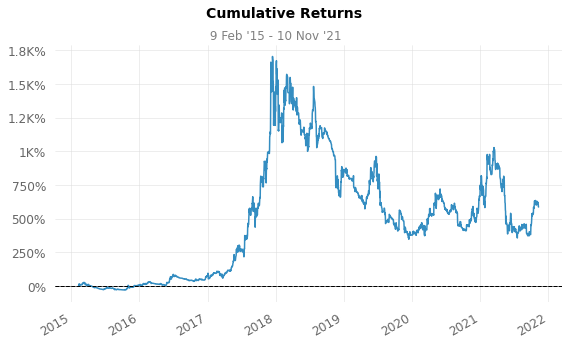

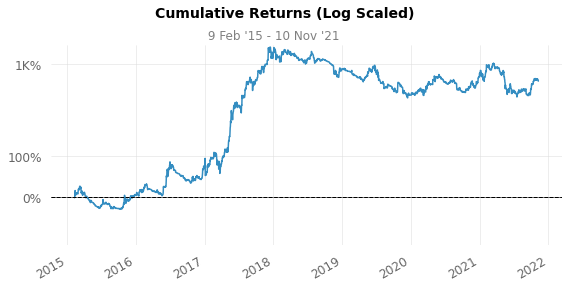

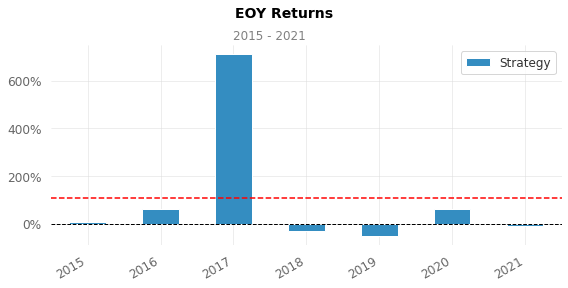

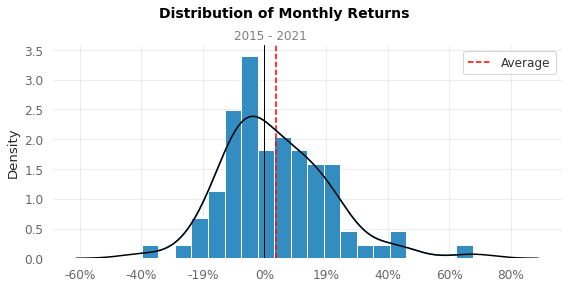

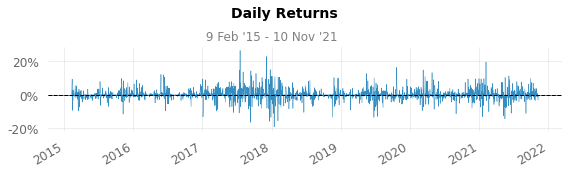

...

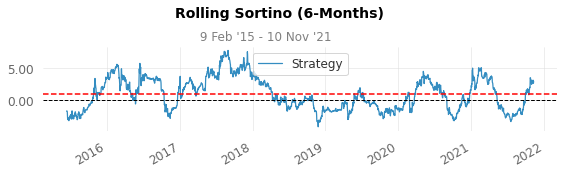

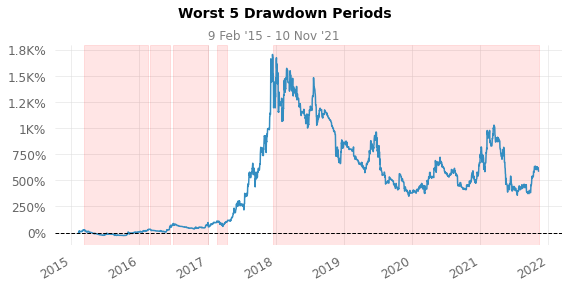

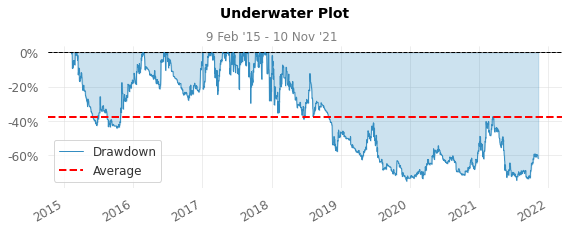

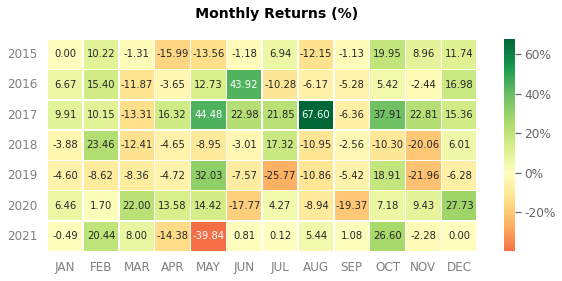

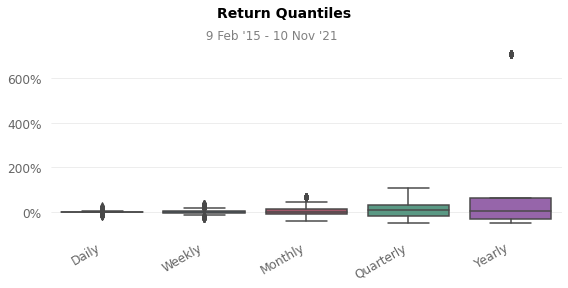

In [ ]:
print_quantstats_full_report(train_PPO, train_data)

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2015-02-09
End Period                 2021-11-10
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          28,611.46%
CAGR﹪                     131.11%

Sharpe                     1.24
Prob. Sharpe Ratio         99.99%
Smart Sharpe               1.18
Sortino                    1.87
Smart Sortino              1.76
Sortino/√2                 1.32
Smart Sortino/√2           1.25
Omega                      1.27

Max Drawdown               -82.92%
Longest DD Days            1079
Volatility (ann.)          62.17%
Calmar                     1.58
Skew                       -0.14
Kurtosis                   7.56

Expected Daily %           0.23%
Expected Monthly %         7.15%
Expected Yearly %          124.47%
Kelly Criterion            11.42%
Risk of Ruin               0.0%
Daily Value-at-Risk        -6.14%
Expected Shortfall (cVaR)  -

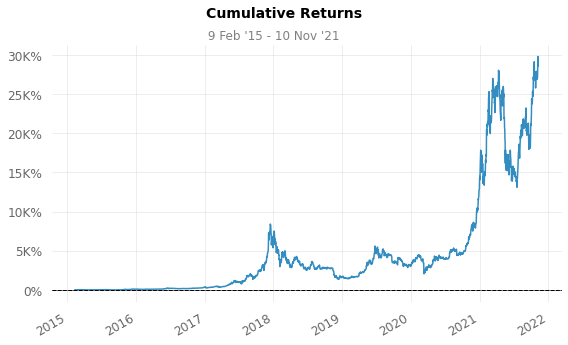

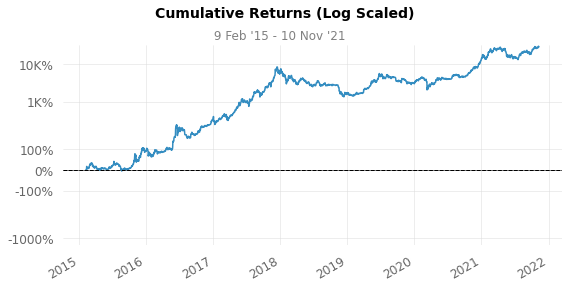

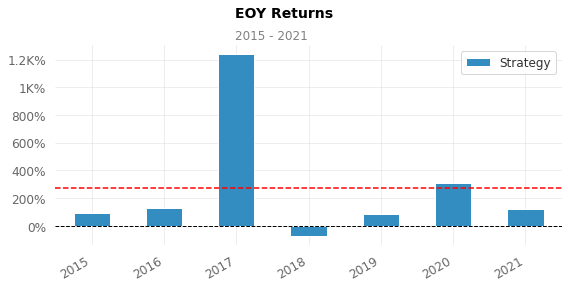

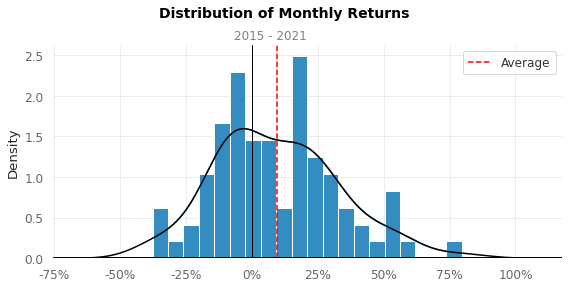

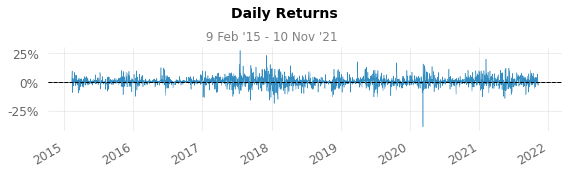

...

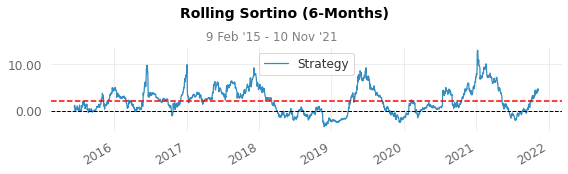

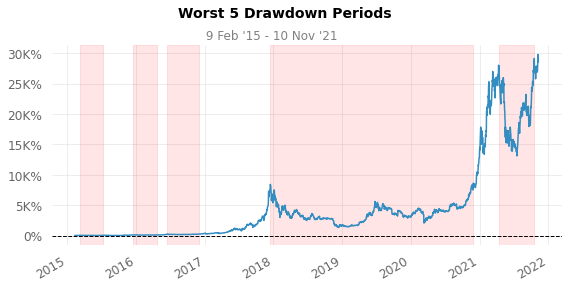

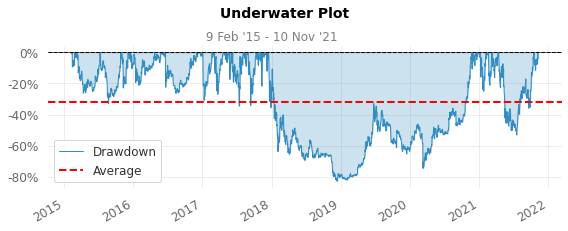

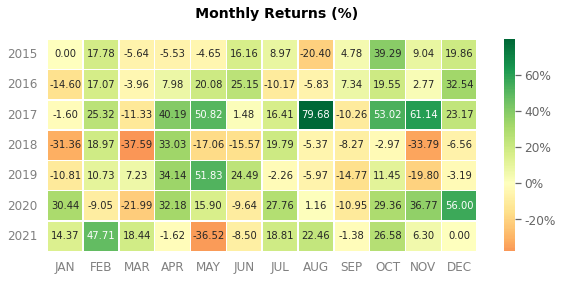

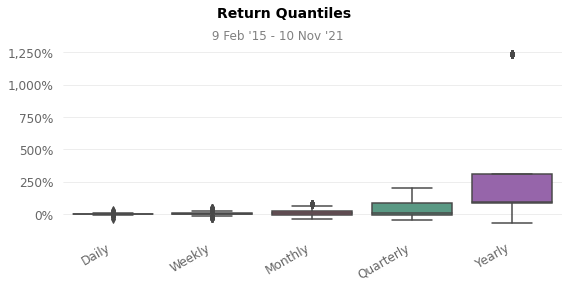

In [ ]:
print_quantstats_full_report(train_A2C, train_data)

**Testing agents**

The Agents see:


Full data contains: 247 steps.
DQN | ran steps = 217 | No. of trade = 19 | % Return = -75.5
PPO | ran steps = 220 | No. of trade = 98 | % Return = -75.0
A2C | ran steps = 229 | No. of trade = 105 | % Return = -75.2
Testing completed


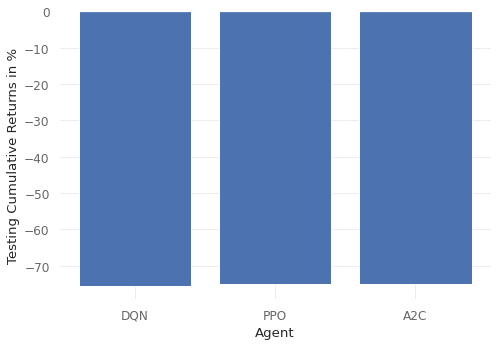

In [ ]:
#Gives comparison
print('The Agents see:')
fig = px.line(test_view, x='date',y= test_view.columns) 
fig.show()

#Setting all testing environments for all agents
test_env = create_env(test_view,test_data , False)

test_DQN = create_env(test_view,test_data, False)
test_PPO = create_env(test_view,test_data, False)
test_A2C = create_env(test_view,test_data, False)
list_test_envs = [test_DQN, test_PPO, test_A2C]

circuit = [DQN, PPO, A2C]
name_agents = ['DQN','PPO','A2C']

#reminder of steps in environment
print('Full data contains:',len(test_data),'steps.')

#Main training loop
test_records = []

for DRL_agents,testing_environments,name in zip(circuit,list_test_envs,name_agents):
  model = DRL_agents

  policy = 'MlpPolicy'

  DRL_agents = model(policy, testing_environments, tensorboard_log="./logs")
  DRL_agents.learn(total_timesteps=len(test_data))

  obs = testing_environments.reset()
  done = False
  while not done:
    action, _states = DRL_agents.predict(obs)
    obs, rewards, done, info = testing_environments.step(action)
  
  test_performance = pd.DataFrame.from_dict(testing_environments.action_scheme.portfolio.performance, orient='index')
  test_net_worth = test_performance['net_worth'].iloc[:]
  test_net_worth = test_net_worth.values[-1]


  test_Number_steps = len(testing_environments.action_scheme.portfolio.performance)
  test_Number_trade = len(testing_environments.action_scheme.broker.trades)

  # networth_records.append([name,ep,net_worth])
  # trade_records.append([Number_steps,Number_steps,])    

  print(name,'| ran steps =',test_Number_steps,'| No. of trade =',test_Number_trade, '| % Return =',round(((test_net_worth-10000)/10000)*100,1))

  test_records.append([name,repeat_ep,test_net_worth,test_Number_steps,test_Number_trade])
  #testing_environments.render()


test_records = pd.DataFrame(test_records)
test_records['returns'] = ((test_records[[2]]-10000)/10000)*100
test_records.rename(columns = {0: 'agents',1:'repeat_agent_training', 2:'networth', 3:'step_ran', 4:'num_trade'}, inplace = True)
test_K_networth_records = test_records

test_DQN_records = test_K_networth_records[test_K_networth_records['agents']=='DQN']
test_PPO_records = test_K_networth_records[test_K_networth_records['agents']=='PPO']
test_A2C_records = test_K_networth_records[test_K_networth_records['agents']=='A2C']

print('Testing completed')

import matplotlib.pyplot as plt
#plot the change in return for all repeat_agent_trainings
fig = plt.figure()
ax = fig.add_axes([0,0,1,1])
ax.bar(test_K_networth_records['agents'],test_K_networth_records['returns'])
plt.ylabel('Testing Cumulative Returns in %')
plt.xlabel('Agent')
plt.show()


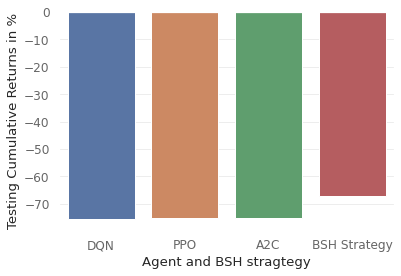

<Figure size 432x288 with 0 Axes>

In [ ]:
BSH_test = pd.DataFrame([['BSH Strategy',-67.2]], columns=['agents','returns'])

compare_BSH_test = pd.concat([test_K_networth_records, BSH_test])

#plot the change in return for all repeat_agent_trainings
# fig = plt.figure()
# ax = fig.add_axes([0,0,1,1])
# ax.bar(compare_BSH_test['agents'],compare_BSH_test['returns'])
# plt.axhline(y=0)
# plt.ylabel('Testing Cumulative Returns in %')
# plt.xlabel('Agent and BSH stragtegy')
# plt.show()


import seaborn as sns

plt.ylabel('Testing Cumulative Returns in %')
test = sns.barplot(y='returns',x='agents',data=compare_BSH_test)

test.set(xlabel='Agent and BSH stragtegy', ylabel='Testing Cumulative Returns in %')

plt.show()

plt.savefig('base_test_results')

**Evaluating Agent performances**

In [ ]:
import quantstats as qs
qs.extend_pandas()


def metrics(env,data):
  performance = pd.DataFrame.from_dict(env.action_scheme.portfolio.performance, orient='index')
  net_worth = performance['net_worth'].iloc[:]

  returns = net_worth.pct_change().iloc[1:]


  returns.index = pd.date_range(start=test_data['date'].iloc[0], freq='1D', periods=returns.size)

  qs.reports.metrics(returns, mode='full')

name_agents = ['DQN','PPO','A2C']

for env,names in zip([test_DQN, test_PPO, test_A2C],name_agents):

  print(names, 'Agent')
  metrics(env,test_data)
  print('============================================')

DQN Agent
                           Strategy
-------------------------  ----------
Start Period               2021-11-12
End Period                 2022-06-15
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -75.48%
CAGR﹪                     -90.8%

Sharpe                     -2.69
Prob. Sharpe Ratio         0.53%
Smart Sharpe               -2.64
Sortino                    -3.22
Smart Sortino              -3.16
Sortino/√2                 -2.28
Smart Sortino/√2           -2.24
Omega                      0.62

Max Drawdown               -75.86%
Longest DD Days            213
Volatility (ann.)          55.04%
Calmar                     -1.2
Skew                       -0.4
Kurtosis                   3.1

Expected Daily %           -0.65%
Expected Monthly %         -16.11%
Expected Yearly %          -50.48%
Kelly Criterion            -27.77%
Risk of Ruin               0.0%
Daily Value-at-Risk        -6.29%
Expected Shortfall (cVaR)  -6.29%

Max 

In [ ]:
# #To save indivual value
# qs.stats.shapre(returns)
#[f for f in dir(qs.stats) if f[0] != '_']
#[f for f in dir(qs.plots) if f[0] != '_']

**Plots for DQN**

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2021-11-12
End Period                 2022-06-15
Risk-Free Rate             0.0%
Time in Market             100.0%

Cumulative Return          -75.48%
CAGR﹪                     -90.8%

Sharpe                     -2.69
Prob. Sharpe Ratio         0.53%
Smart Sharpe               -2.64
Sortino                    -3.22
Smart Sortino              -3.16
Sortino/√2                 -2.28
Smart Sortino/√2           -2.24
Omega                      0.62

Max Drawdown               -75.86%
Longest DD Days            213
Volatility (ann.)          55.04%
Calmar                     -1.2
Skew                       -0.4
Kurtosis                   3.1

Expected Daily %           -0.65%
Expected Monthly %         -16.11%
Expected Yearly %          -50.48%
Kelly Criterion            -27.77%
Risk of Ruin               0.0%
Daily Value-at-Risk        -6.29%
Expected Shortfall (cVaR) 

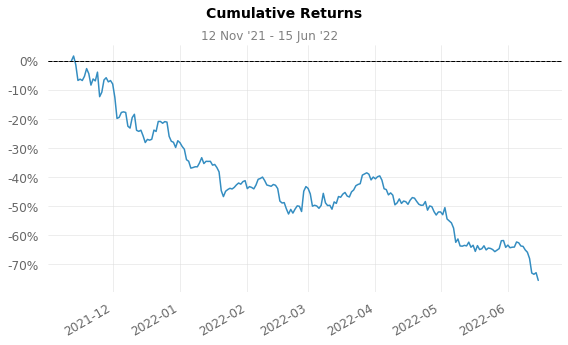

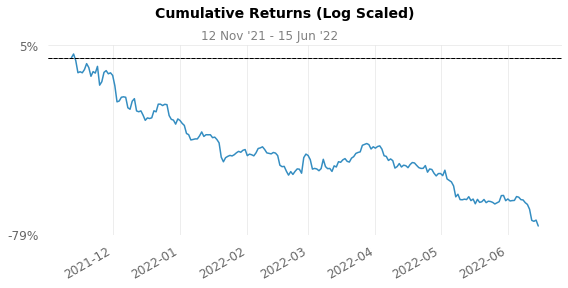

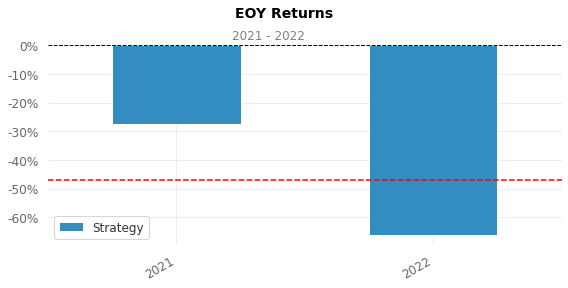

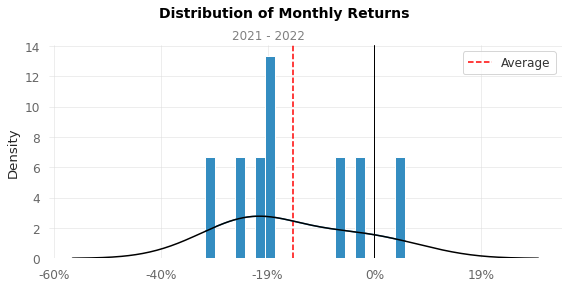

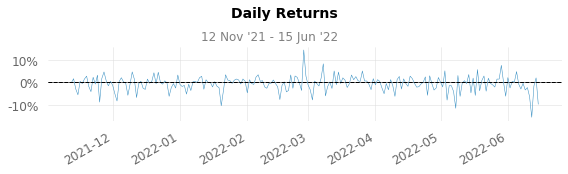

...

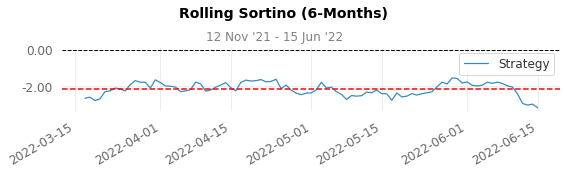

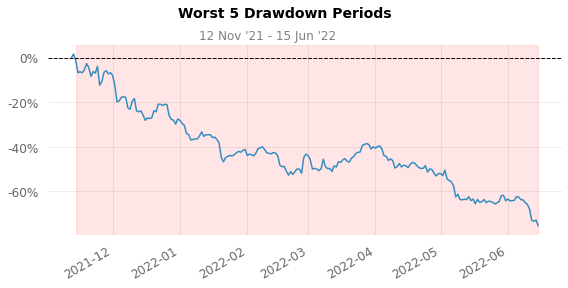

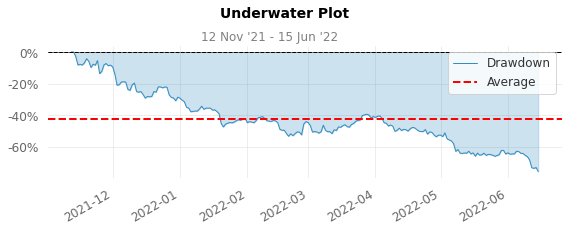

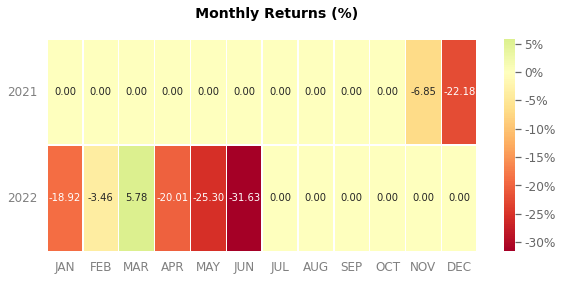

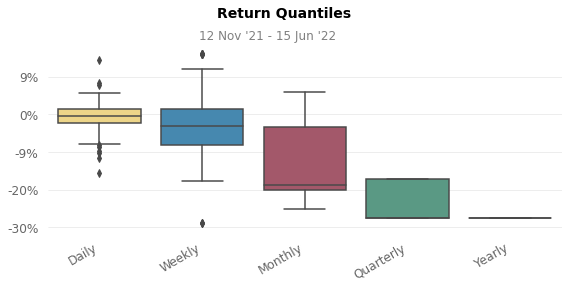

In [ ]:

#Select from these environments:
test_DQN
test_PPO
test_A2C



print_quantstats_full_report(test_DQN, test_data)

**Plots for PPO**

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2021-11-12
End Period                 2022-06-18
Risk-Free Rate             0.0%
Time in Market             84.0%

Cumulative Return          -75.01%
CAGR﹪                     -90.19%

Sharpe                     -3.54
Prob. Sharpe Ratio         0.03%
Smart Sharpe               -3.48
Sortino                    -4.09
Smart Sortino              -4.02
Sortino/√2                 -2.89
Smart Sortino/√2           -2.84
Omega                      0.48

Max Drawdown               -75.01%
Longest DD Days            216
Volatility (ann.)          42.35%
Calmar                     -1.2
Skew                       -0.55
Kurtosis                   3.73

Expected Daily %           -0.63%
Expected Monthly %         -15.91%
Expected Yearly %          -50.01%
Kelly Criterion            -34.35%
Risk of Ruin               0.0%
Daily Value-at-Risk        -4.98%
Expected Shortfall (cVaR

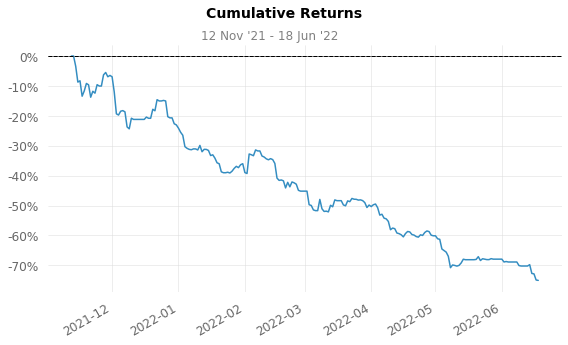

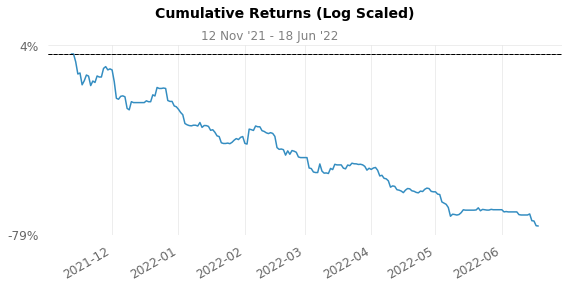

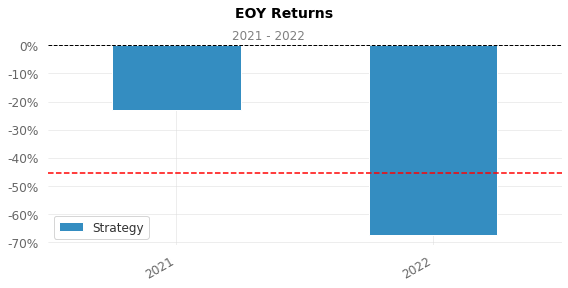

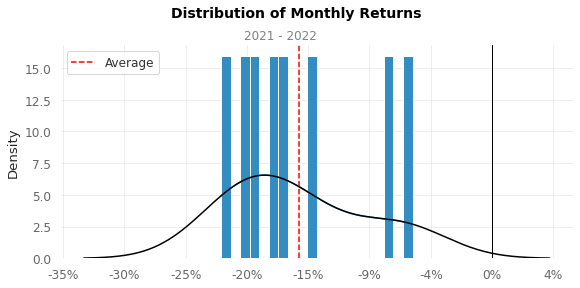

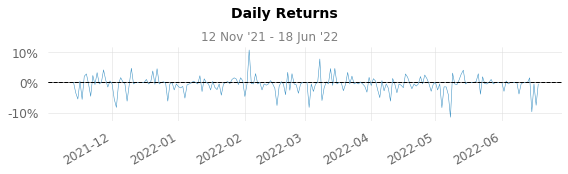

...

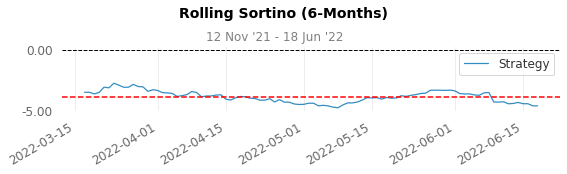

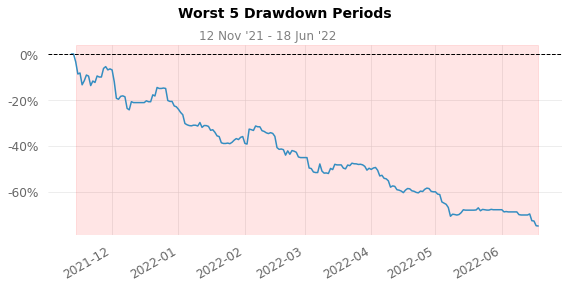

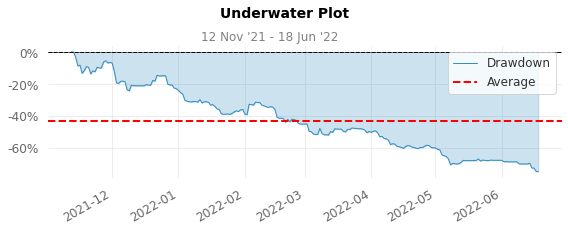

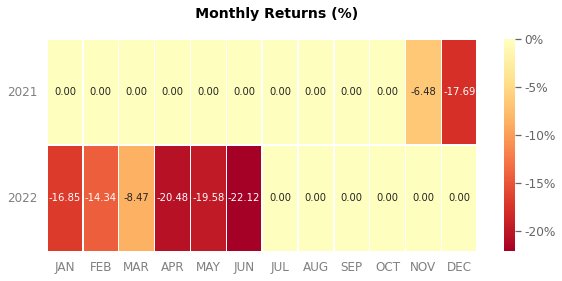

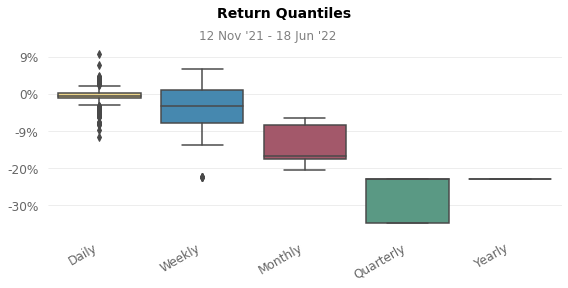

In [ ]:
print_quantstats_full_report(test_PPO, test_data)

**Plots for A2C**

[Performance Metrics]

                           Strategy
-------------------------  ----------
Start Period               2021-11-12
End Period                 2022-06-27
Risk-Free Rate             0.0%
Time in Market             64.0%

Cumulative Return          -75.18%
CAGR﹪                     -89.36%

Sharpe                     -4.18
Prob. Sharpe Ratio         0.0%
Smart Sharpe               -3.93
Sortino                    -4.64
Smart Sortino              -4.36
Sortino/√2                 -3.28
Smart Sortino/√2           -3.08
Omega                      0.33

Max Drawdown               -75.18%
Longest DD Days            223
Volatility (ann.)          35.19%
Calmar                     -1.19
Skew                       -0.93
Kurtosis                   8.24

Expected Daily %           -0.61%
Expected Monthly %         -15.98%
Expected Yearly %          -50.18%
Kelly Criterion            -50.93%
Risk of Ruin               0.0%
Daily Value-at-Risk        -4.23%
Expected Shortfall (cVaR

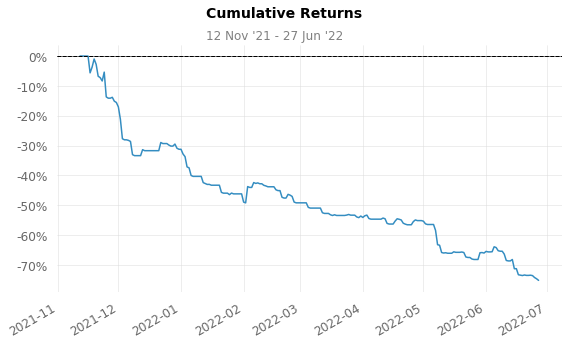

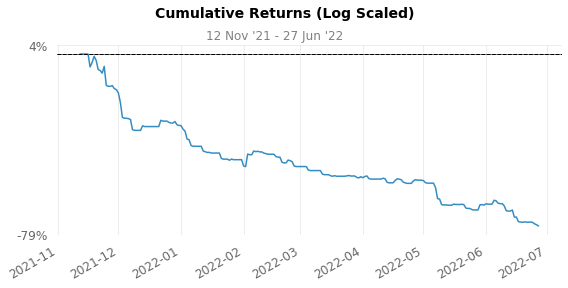

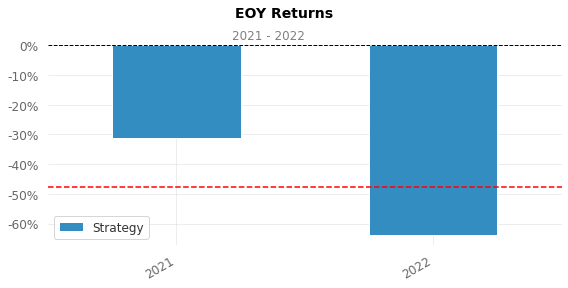

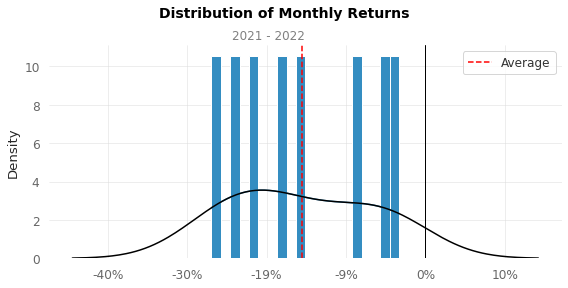

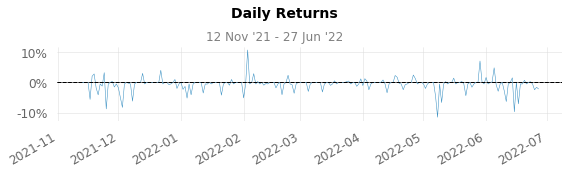

...

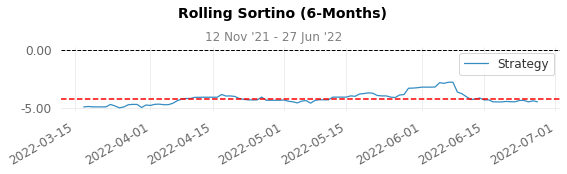

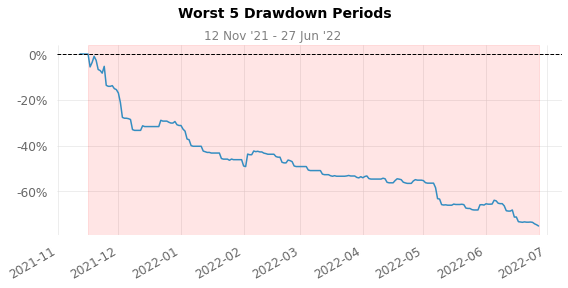

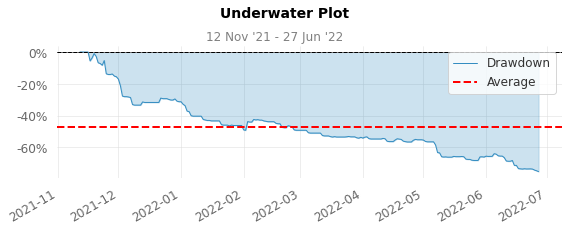

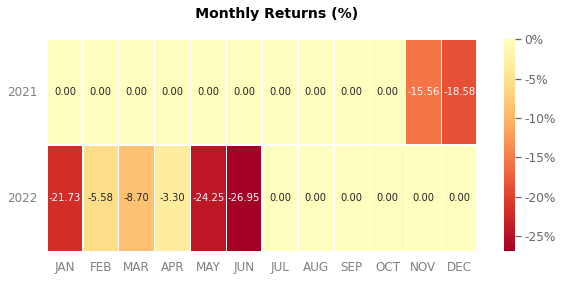

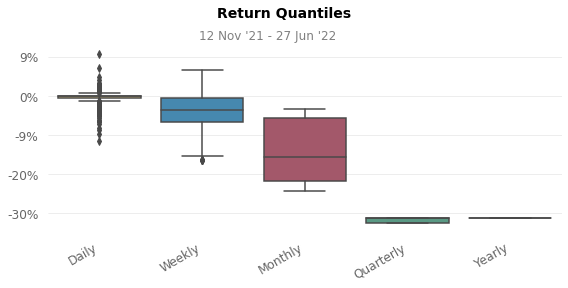

In [ ]:
print_quantstats_full_report(test_A2C, test_data)